In [ ]:
!pip install ultralytics opencv-python-headless
import torch
from ultralytics import YOLO
import cv2
import pickle
import matplotlib.pyplot as plt


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.9/871.9 kB 19.9 MB/s eta 0:00:00


In [ ]:
class Image():
  def __init__(self, x_path, y_path, real, mask):
    self.x_path= x_path
    self.y_path= y_path
    self.real= real
    self.mask= mask
    self.head_mask, self.eye_mask= process_mask(mask)

  def getXPath(self):
    return self.x_path

  def getYPath(self):
    return self.y_path

  def getMask(self):
    return self.mask

  def getHeadMask(self):
    return self.real

  def getEyeMask(self):
    return self.mask

import pickle

# Desserializando o objeto
with open('/content/drive/MyDrive/yolo_images_model.pkl', 'rb') as file:
    images = pickle.load(file)

# Agora 'dados' contém o dicionário que foi salvo
print(images)

[<__main__.Image object at 0x7d85087d9d80>, <__main__.Image object at 0x7d85d4fe8a60>, <__main__.Image object at 0x7d85d42e1a80>, <__main__.Image object at 0x7d85d42e1e10>, <__main__.Image object at 0x7d85d42e0280>, <__main__.Image object at 0x7d85d42e1f00>, <__main__.Image object at 0x7d84f915bb50>, <__main__.Image object at 0x7d84f915ba00>, <__main__.Image object at 0x7d84f915b430>, <__main__.Image object at 0x7d84f915b9a0>, <__main__.Image object at 0x7d84f91c13f0>, <__main__.Image object at 0x7d84f91c14e0>, <__main__.Image object at 0x7d84f91c15d0>, <__main__.Image object at 0x7d84f91c25f0>, <__main__.Image object at 0x7d84f91c2500>, <__main__.Image object at 0x7d84f91c2410>, <__main__.Image object at 0x7d84f91c2320>, <__main__.Image object at 0x7d84f91c2230>, <__main__.Image object at 0x7d84f91c0160>, <__main__.Image object at 0x7d84f91c0070>, <__main__.Image object at 0x7d84f91c3250>, <__main__.Image object at 0x7d84f91c0f10>, <__main__.Image object at 0x7d84f91c1000>, <__main__.

Tipo de dado: <class 'list'>


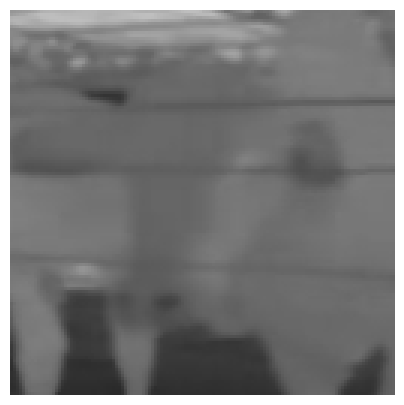

In [ ]:
import matplotlib.pyplot as plt
import pickle

# Desserializando o objeto
with open('/content/drive/MyDrive/yolo_images_model.pkl', 'rb') as file:
    images = pickle.load(file)

# Verificando o tipo de dados carregados
print(f"Tipo de dado: {type(images)}")

# Se 'images' for uma lista, acessar o primeiro item
if isinstance(images, list) and len(images) > 0:
    first_image_object = images[30]  # Pegando o primeiro objeto da lista
    real_image_array = first_image_object.getHeadMask()  # Obtendo a matriz da imagem da pasta 'real'

    # Verificando o tipo de dado da imagem
    if isinstance(real_image_array, list):  # Verificando se a imagem é uma lista de listas
        real_image_array = np.array(real_image_array)  # Convertendo para um array NumPy

    # Exibindo a imagem usando matplotlib
    plt.figure(figsize=(5, 5))
    plt.imshow(real_image_array, cmap='gray')  # Ajuste de cor conforme necessário
    plt.axis('off')  # Desativar os eixos
    plt.show()
else:
    print("O arquivo .pkl não contém uma lista ou dicionário de imagens.")


In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Caminhos para as pastas de imagens e máscaras
IMAGE_PATH = "/content/drive/MyDrive/Colab Notebooks/dados/X"
MASK_PATH = "/content/drive/MyDrive/Colab Notebooks/dados/Y"
OUTPUT_PATH = "/content/drive/MyDrive/Colab Notebooks/dados/output"

# Função para criar bounding boxes a partir das máscaras
def create_bounding_box(image_path, mask_path, output_path):
    # Carrega a imagem e a máscara
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)


    # Encontra os contornos na máscara
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Para cada contorno, cria uma bounding box
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)  # Obter as coordenadas da bounding box

        # Desenhar a bounding box na imagem original
        cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
        print(f"Bounding box desenhada para a imagem {image_path}: Top Left ({x}, {y}), Bottom Right ({x+w}, {y+h})")

    # Salva a imagem com a bounding box desenhada
    image_filename = os.path.basename(image_path)
    output_image_path = os.path.join(output_path, image_filename)
    cv2.imwrite(output_image_path, image)

# Certifique-se de que a pasta de saída existe
if not os.path.exists(OUTPUT_PATH):
    os.makedirs(OUTPUT_PATH)

# Lista de imagens e máscaras
image_files = sorted(os.listdir(IMAGE_PATH))
mask_files = sorted(os.listdir(MASK_PATH))

# Loop para processar todas as imagens e suas máscaras correspondentes
for image_file, mask_file in zip(image_files, mask_files):
    image_path = os.path.join(IMAGE_PATH, image_file)
    mask_path = os.path.join(MASK_PATH, mask_file)

    # Criar bounding box para cada par de imagem e máscara
    create_bounding_box(image_path, mask_path, OUTPUT_PATH)

print("Bounding boxes criadas e imagens salvas em:", OUTPUT_PATH)


Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_video2_00000000210000100.mp4_0058_1_x.png: Top Left (23, 9), Bottom Right (114, 100)
Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_video2_00000000210000100.mp4_0061_1_x.png: Top Left (14, 14), Bottom Right (105, 105)
Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_video2_00000000210000100.mp4_0071_1_x.png: Top Left (27, 13), Bottom Right (119, 105)
Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_video2_00000000210000100.mp4_0072_1_x.png: Top Left (18, 23), Bottom Right (110, 114)
Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_video2_00000000210000100.mp4_0078_1_x.png: Top Left (18, 9), Bottom Right (110, 100)
Bounding box desenhada para a imagem /content/drive/MyDrive/Colab Notebooks/dados/X/02-08-2024_vi

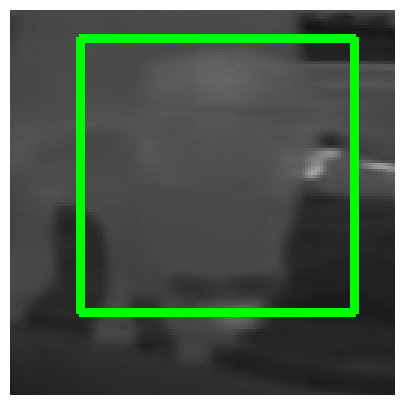

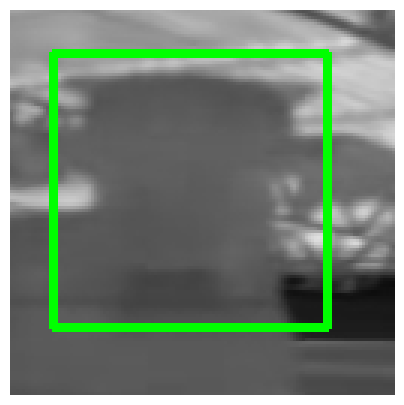

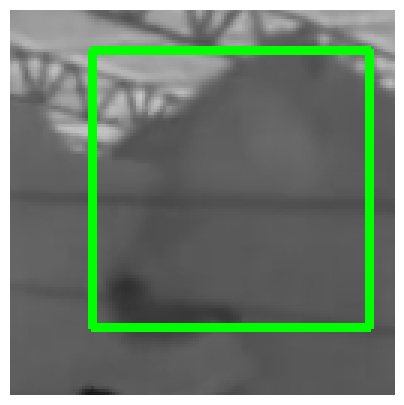

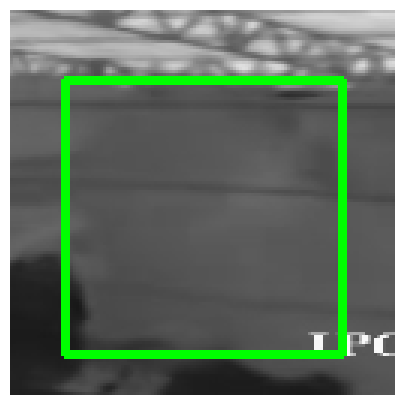

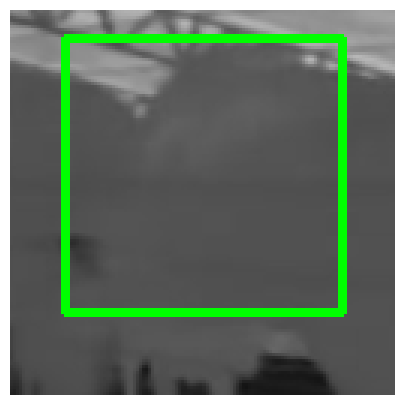

...

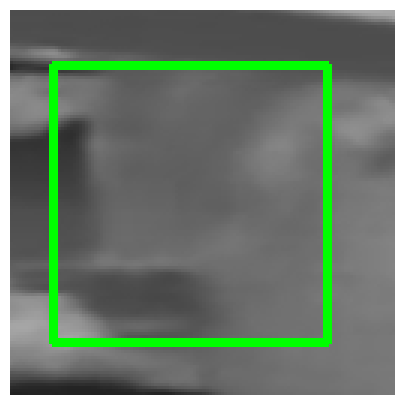

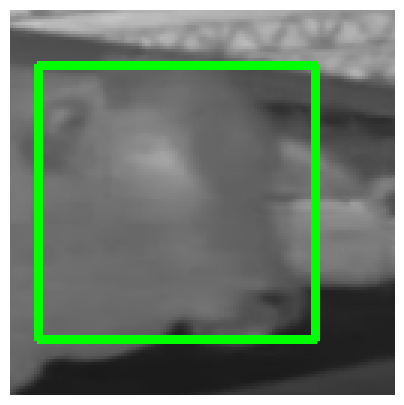

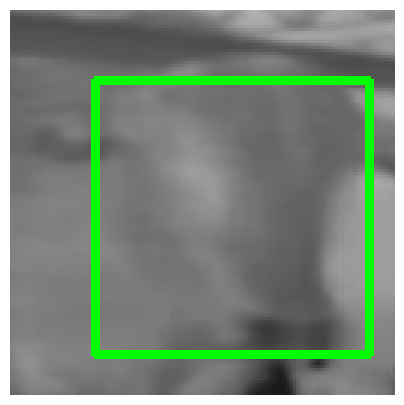

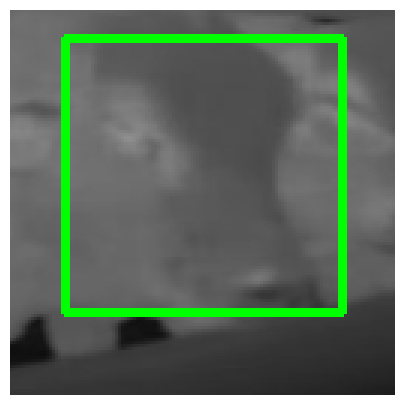

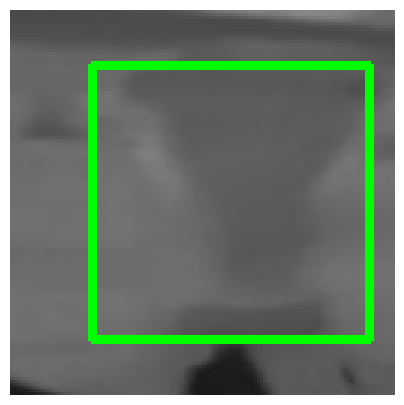

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Função para exibir a imagem com bounding boxes
def show_image(image_path):
    # Carrega a imagem processada com bounding boxes
    image = cv2.imread(image_path)

    # Verifica se a imagem foi carregada corretamente
    if image is None:
        print(f"Erro ao carregar a imagem: {image_path}")
        return

    # Converter imagem de BGR (OpenCV) para RGB (para exibir corretamente no matplotlib)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Exibir a imagem com matplotlib
    plt.figure(figsize=(5, 5))
    plt.imshow(image_rgb)
    plt.axis('off')  # Desativar os eixos
    plt.show()

# Exibir todas as imagens processadas
output_files = sorted(os.listdir(OUTPUT_PATH))

for output_file in output_files:
    output_image_path = os.path.join(OUTPUT_PATH, output_file)
    show_image(output_image_path)
